In [1]:
import numpy as np
import logging
import itertools
from tqdm import tqdm
import datetime
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from scipy.stats import chi2
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error 
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle

In [ ]:
df = pd.read_csv('/mnt/ffs24/home/lirui15/Research/Model1-ECFP/model1_reduced1_BCF.csv')

features = df.iloc[:, :-1] 
target = df.iloc[:, -1] 

In [ ]:
print(type(features))  
print(type(target))  
feature_names = features.columns.tolist()

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


In [ ]:
features, target = shuffle(features, target, random_state=42)

In [ ]:
#scaler = StandardScaler()
#features = scaler.fit_transform(features)

In [ ]:
X_train_val, X_test, Y_train_val, Y_test = train_test_split(features, target, test_size=0.1, random_state=42)

X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, test_size=0.2, random_state=42)

In [8]:
print(X_val.shape)

(360, 92)


In [ ]:
logger = logging.getLogger('XGBoost_gridsearch_noscaled_model1_reduced1_BCF')
logger.setLevel(logging.INFO)

handler = logging.FileHandler('XGBoost_gridsearch_noscaled_model1_reduced1_BCF.log')
handler.setLevel(logging.INFO)
logger.addHandler(handler)

In [ ]:
model2 = XGBRegressor(n_estimators= 100,random_state=100,early_stopping_rounds=10)

In [ ]:
param_grid = {
    'n_estimators': range(10,80,10),
    'learning_rate': [0.1],
    'max_depth': range(1,11,2),
    'min_child_weight': range(1,13,2),
    'gamma': np.arange(0.00,1.10,0.20),
    'subsample': np.arange(0.50,1.00,0.10)
}


num_combinations = len(list(itertools.product(*param_grid.values())))

cv = 10

total_fits = num_combinations * cv

logger.info("\nParameter grid: %s", param_grid)
logger.info("CV: %d", cv)
logger.info("Total number of fits: %d", total_fits)

class TqdmUpTo(tqdm):
    def update_to(self, b=1, bsize=1, tsize=None):
        if tsize is not None:
            self.total = tsize
        self.update(b * bsize - self.n)

with TqdmUpTo(unit='B', unit_scale=True, miniters=1, desc='GridSearchCV') as t:

    start_time = datetime.datetime.now()
    logger.info("Start time: %s", start_time)
    
    grid_search = GridSearchCV(model2, param_grid=param_grid, cv=cv, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, Y_train.values.ravel(), eval_set=[(X_val, Y_val)], verbose=False)
    
    end_time = datetime.datetime.now()
    logger.info("End time: %s", end_time)

    total_time = end_time - start_time
    logger.info("Total run time: %s", total_time)

logger.info("Best parameters: %s", grid_search.best_params_)
logger.info("Best score: %f", grid_search.best_score_)

GridSearchCV: 0.00B [00:00, ?B/s]

Fitting 10 folds for each of 6300 candidates, totalling 63000 fits
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=10, subsample=0.5; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=10, subsample=0.6; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=10, subsample=0.7; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=10, subsample=0.7999999999999999; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=10, subsample=0.8999999999999999; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=20, subsample=0.6; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=20, subsample=0.7; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max

GridSearchCV: 0.00B [11:25, ?B/s]



[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=10, subsample=0.7; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=10, subsample=0.7; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=10, subsample=0.8999999999999999; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=10, subsample=0.8999999999999999; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=20, subsample=0.6; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=20, subsample=0.6; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=20, subsample=0.8999999999999999; total time=   0.1s
[CV] END gamma=1.0, learning_rate=0.1, max_depth=9, min_child_weight=9, n_estimators=20, subs

In [ ]:
param_grid = {
    'n_estimators': range(80,130,10),
    'learning_rate': [0.1],
    'max_depth': range(1,11,2),
    'min_child_weight': range(1,13,2),
    'gamma': np.arange(0.00,1.10,0.20),
    'subsample': np.arange(0.50,1.00,0.10)
}

num_combinations = len(list(itertools.product(*param_grid.values())))

cv = 10

total_fits = num_combinations * cv

logger.info("\nParameter grid: %s", param_grid)
logger.info("CV: %d", cv)
logger.info("Total number of fits: %d", total_fits)

class TqdmUpTo(tqdm):
    def update_to(self, b=1, bsize=1, tsize=None):
        if tsize is not None:
            self.total = tsize
        self.update(b * bsize - self.n)

with TqdmUpTo(unit='B', unit_scale=True, miniters=1, desc='GridSearchCV') as t:

    start_time = datetime.datetime.now()
    logger.info("Start time: %s", start_time)
    
    grid_search = GridSearchCV(model2, param_grid=param_grid, cv=cv, n_jobs=-1, verbose=2)
    grid_search.fit(X_train, Y_train.values.ravel(),eval_set=[(X_val, Y_val)],verbose=False)

    end_time = datetime.datetime.now()
    logger.info("End time: %s", end_time)

    total_time = end_time - start_time
    logger.info("Total run time: %s", total_time)

logger.info("Best parameters: %s", grid_search.best_params_)
logger.info("Best score: %f", grid_search.best_score_)

GridSearchCV: 0.00B [00:00, ?B/s]

Fitting 10 folds for each of 4500 candidates, totalling 45000 fits
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=80, subsample=0.5; total time=   0.2s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=80, subsample=0.7; total time=   0.2s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=80, subsample=0.7999999999999999; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=80, subsample=0.8999999999999999; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=90, subsample=0.5; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=90, subsample=0.7; total time=   0.1s
[CV] END gamma=0.0, learning_rate=0.1, max_depth=1, min_child_weight=1, n_estimators=90, subsample=0.7999999999999999; total time=   0.1s
[CV] END gamma=0.0, learnin

In [ ]:
best_params = {
    'n_estimators': 120,
    'learning_rate': 0.1,
    'max_depth': 9,
    'min_child_weight': 1,
    'gamma': 0.0,
    'subsample': 0.7,
    'random_state':100
}

model_best = XGBRegressor(**best_params)
model_best.fit(X_train,Y_train.values.ravel())

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=9, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=120, n_jobs=None,
             num_parallel_tree=None, random_state=100, ...)

In [ ]:
y_train_pred = model_best.predict(X_train)

mse_train = mean_squared_error(Y_train, y_train_pred)
print(f"Mean squared error on the training set: {mse_train}")
rmse_train = np.sqrt(mse_train)
print(f"Root mean squared error on the training set: {rmse_train}")
mae_train = mean_absolute_error(Y_train, y_train_pred)
print(f"Mean absolute error on the training set: {mae_train}")
r2_train = r2_score(Y_train, y_train_pred)
print(f"R² score on the training set: {r2_train}")

y_pred = model_best.predict(X_val)

mse = mean_squared_error(Y_val, y_pred)
print(f"Mean squared error on the validation set: {mse}")
rmse = np.sqrt(mse)
print(f"Root mean squared error on the validation set: {rmse}")
mae = mean_absolute_error(Y_val, y_pred)
print(f"Mean absolute error on the validation set: {mae}")
r2 = r2_score(Y_val, y_pred)
print(f"R² score on the validation set: {r2}")

Mean squared error on the training set: 0.011005635197842232
Root mean squared error on the training set: 0.10490774612888332
Mean absolute error on the training set: 0.0677567340014305
R² score on the training set: 0.9957411454460044
Mean squared error on the validation set: 0.14928946038917448
Root mean squared error on the validation set: 0.38637994304722195
Mean absolute error on the validation set: 0.24174454537576504
R² score on the validation set: 0.9380773208684227


In [ ]:
# Predict on the test set
y_test_pred = model_best.predict(X_test)

mse_test = mean_squared_error(Y_test, y_test_pred)
print(f"Mean squared error on the test set: {mse_test}")
rmse_test = np.sqrt(mse_test)
print(f"Root mean squared error on the test set: {rmse_test}")
mae_test = mean_absolute_error(Y_test, y_test_pred)
print(f"Mean absolute error on the test set: {mae_test}")
r2_test = r2_score(Y_test, y_test_pred)
print(f"R² score on the test set: {r2_test}")

Mean squared error on the test set: 0.14701271552996997
Root mean squared error on the test set: 0.3834223722345502
Mean absolute error on the test set: 0.23949639354478866
R² score on the test set: 0.9511556504254983


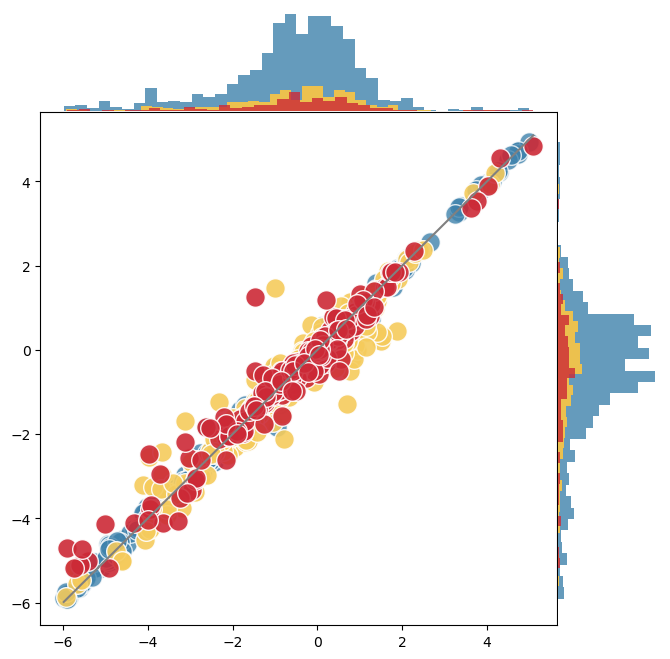

In [ ]:
fig = plt.figure(figsize=(8, 8))
grid = plt.GridSpec(6, 6, hspace=0.01, wspace=0.01)

ax_main = fig.add_subplot(grid[1:6, 0:5])
ax_main.scatter(Y_train, y_train_pred, color='#3F82AC', alpha=0.8, s=160, edgecolor='white', label='Training set')
ax_main.scatter(Y_val, y_pred, color='#F5CB5C', alpha=0.9, s=160, edgecolor='white', label='Validation set')
ax_main.scatter(Y_test, y_test_pred, color='#CC2936', alpha=0.9, s=160, edgecolor='white', label='Test set')

min_val = min(Y_train.min(), Y_val.min(), Y_test.min())
max_val = max(Y_train.max(), Y_val.max(), Y_test.max())
ax_main.plot([min_val, max_val], [min_val, max_val], color='gray', linestyle='-', linewidth=1.5)

ax_histx = fig.add_subplot(grid[0, 0:5])
ax_histx.hist(Y_train, color='#3F82AC', alpha=0.8, bins=40)
ax_histx.hist(Y_val, color='#fcc642', alpha=0.9, bins=40)
ax_histx.hist(Y_test, color='#CC2936', alpha=0.8, bins=40)

ax_histx.set_xticks([])
ax_histx.set_yticks([])
ax_histx.set_xlabel('')
ax_histx.set_ylabel('')
ax_histx.spines['top'].set_visible(False)
ax_histx.spines['right'].set_visible(False)
ax_histx.spines['bottom'].set_visible(False)
ax_histx.spines['left'].set_visible(False)
ax_histx.set_xlim(ax_main.get_xlim())

ax_histy = fig.add_subplot(grid[1:6, 5])
ax_histy.hist(y_train_pred, color='#3F82AC', alpha=0.8, bins=40, orientation='horizontal')
ax_histy.hist(y_pred, color='#fcc642', alpha=0.9, bins=40, orientation='horizontal')
ax_histy.hist(y_test_pred, color='#CC2936', alpha=0.8, bins=40, orientation='horizontal')

ax_histy.set_xticks([])
ax_histy.set_yticks([])
ax_histy.set_xlabel('')
ax_histy.set_ylabel('')
ax_histy.spines['top'].set_visible(False)
ax_histy.spines['right'].set_visible(False)
ax_histy.spines['bottom'].set_visible(False)
ax_histy.spines['left'].set_visible(False)
ax_histy.set_ylim(ax_main.get_ylim()) 

#plt.savefig('XGB-BCF.pdf', dpi=300, bbox_inches='tight')
plt.show()

# Feature importance #

## Permutation importance ##

All Feature Importances：
Carbon chain length: 0.997809
Additional input: 0.028530
Soil  organic matter: 0.038697
Soil pH: 1.633354
Cation exchange capacity: 0.372717
Exposure time: 0.092510
Initial concentration in soil: 0.206959
ECFP_7: 0.003738
ECFP_20: 0.001093
ECFP_125: 0.001243
ECFP_239: 0.000537
ECFP_279: 0.000000
ECFP_281: 0.000483
ECFP_347: 0.000944
ECFP_559: 0.000176
ECFP_716: 0.000008
ECFP_780: 0.006674
ECFP_789: 0.000017
ECFP_803: 0.006458
ECFP_808: 0.019914
ECFP_863: 0.024446
ECFP_865: 0.002401
ECFP_870: 0.000000
ECFP_898: 0.000002
ECFP_911: 0.000000
ECFP_917: 0.000000
ECFP_925: 0.001962
ECFP_926: 0.001291
ECFP_969: 0.029511
ECFP_983: 0.000000
ECFP_994: 0.000002
ECFP_996: 0.002650
ECFP_1016: 0.000244
ECFP_1021: 0.000033
ECFP_1022: 0.000042
Cultivatin condition: 0.002732
Casparian strip: 0.009156
Plant species_Alfalfa (Medicago sativa L.): 0.000605
Plant species_Carrot (Daucus carota L.): 0.001735
Plant species_Celery (Apium graveolens L.): 0.000219
Plant species_Italian rye

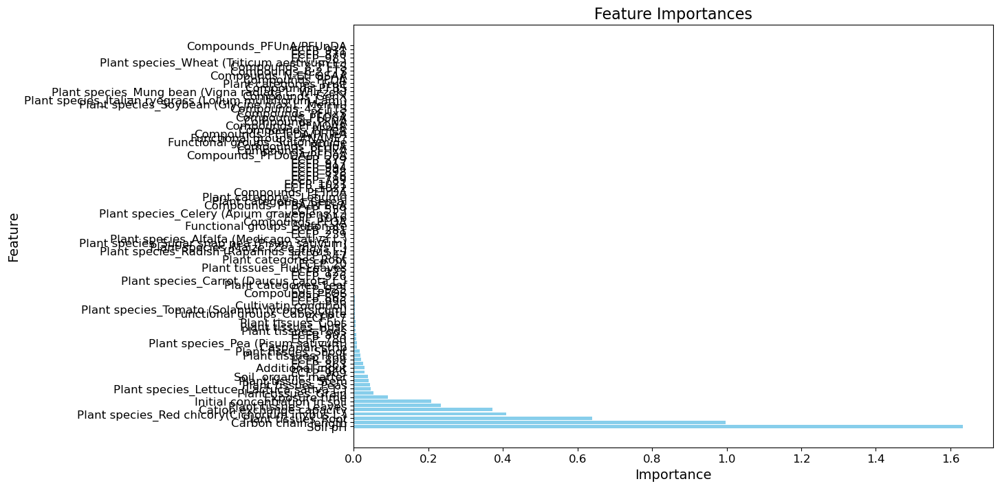

                                           Feature  Permutation Importance
3                                          Soil pH                1.633354
0                              Carbon chain length                0.997809
89                              Plant tissues_Root                0.639348
46  Plant species_Red chicory(Cichorium inybus L.)                0.408247
4                         Cation exchange capacity                0.372717
..                                             ...                     ...
64                          Compounds_PFDoDA/PFDoA                0.000000
69                                  Compounds_PFNA                0.000000
77                        Functional groups_#NAME?                0.000000
79                   Functional groups_Sulfonamide                0.000000
76                          Compounds_PFUnA/PFUnDA               -0.000004

[92 rows x 2 columns]


In [ ]:
from sklearn.inspection import permutation_importance

X_full = pd.concat([X_train, X_val, X_test])
Y_full = pd.concat([Y_train, Y_val, Y_test])

result = permutation_importance(model_best, X_full , Y_full , n_repeats=30, scoring="neg_mean_squared_error", random_state=42)

perm_importances = result.importances_mean

all_importances = perm_importances.tolist()

print("All Feature Importances：")
for name, importance in zip(feature_names, all_importances):
    print(f"{name}: {importance:.6f}")

plt.figure(figsize=(12, 8))
plt.title("Feature Importances", fontsize=16)

sorted_indices = np.argsort(all_importances)[::-1]
sorted_importances = np.array(all_importances)[sorted_indices]
sorted_feature_names = np.array(feature_names)[sorted_indices]

bar_positions = np.arange(len(sorted_feature_names))
plt.barh(bar_positions, sorted_importances, color="skyblue")

plt.yticks(bar_positions, sorted_feature_names, fontsize=12)
plt.xticks(fontsize=12)
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.show()

importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Permutation Importance': all_importances
})

importance_df = importance_df.sort_values(by='Permutation Importance', ascending=False)

print(importance_df)

importance_df.to_csv('XGBoost-model1-reduced1_BCF_X_full_Permutation Importance.csv', index=False)

## SHAP importance ##

## X_full ##

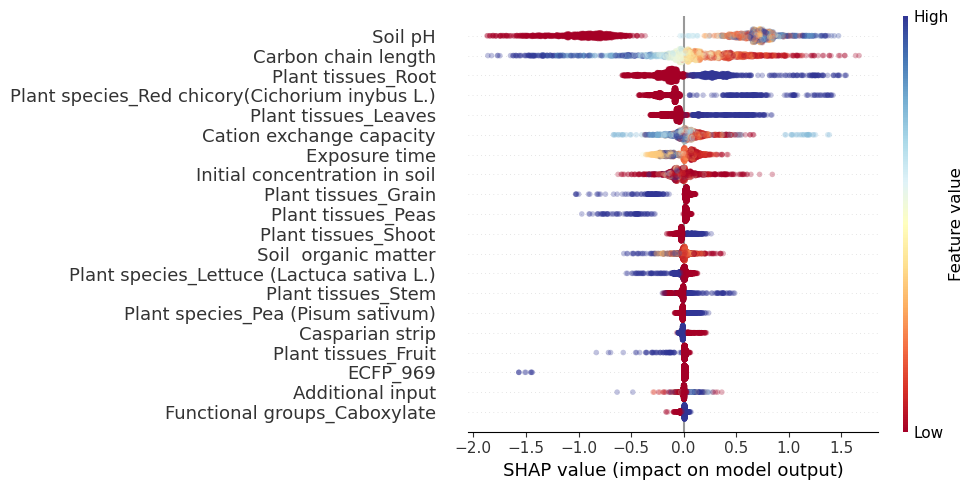

In [ ]:
import shap

explainer = shap.TreeExplainer(model_best)

X_full = pd.concat([X_train, X_val, X_test])
Y_full = pd.concat([Y_train, Y_val, Y_test])

shap_values_full = explainer.shap_values(X_full)
shap.summary_plot(shap_values_full, X_full, alpha=0.3, plot_size=(10, 5), cmap="RdYlBu", show=False)
#plt.savefig('shap_BCF_X_full.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
feature_importances = np.mean(np.abs(shap_values_full), axis=0)

importance_df = pd.DataFrame({
    'Feature': feature_names,
    'SHAP Importance': feature_importances
})

importance_df = importance_df.sort_values(by='SHAP Importance', ascending=False)

print(importance_df)
importance_df.to_csv('XGBoost-SHAP-X_full-model1-reduced1_BCF.csv', index=False)

                                           Feature  SHAP Importance
3                                          Soil pH         0.818896
0                              Carbon chain length         0.353669
89                              Plant tissues_Root         0.247943
46  Plant species_Red chicory(Cichorium inybus L.)         0.207327
86                            Plant tissues_Leaves         0.142234
..                                             ...              ...
64                          Compounds_PFDoDA/PFDoA         0.000000
69                                  Compounds_PFNA         0.000000
65                                 Compounds_PFHpA         0.000000
77                        Functional groups_#NAME?         0.000000
79                   Functional groups_Sulfonamide         0.000000

[92 rows x 2 columns]


In [47]:
X_full = pd.DataFrame(X_full)
shap_values_full = pd.DataFrame(shap_values_full)


X_full.to_csv('X_full.csv', index=False)

shap_values_full.to_csv('shap_values_full.csv', index=False)

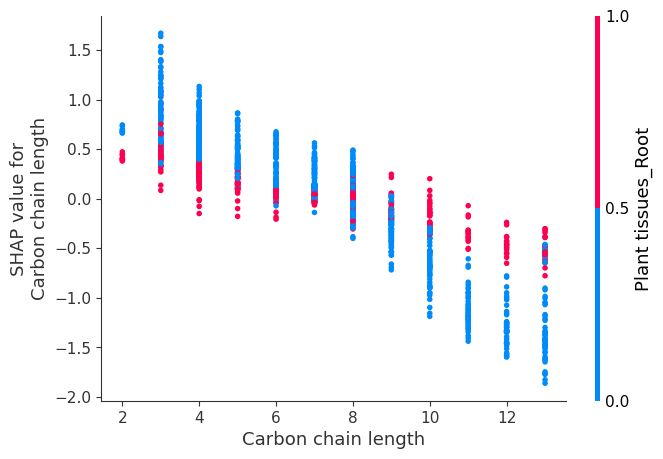

In [27]:
feature_index1 = 0
feature_index2 = 89

shap.dependence_plot(feature_index1, shap_values_full, X_full, interaction_index=feature_index2)

plt.show()

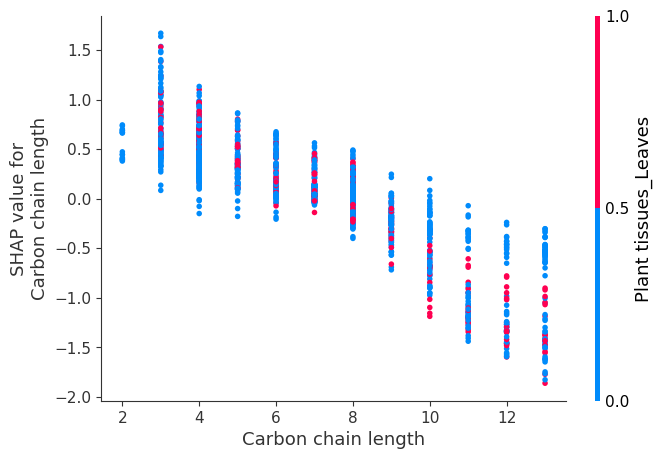

In [28]:
feature_index1 = 0
feature_index2 = 86

shap.dependence_plot(feature_index1, shap_values_full, X_full, interaction_index=feature_index2)

plt.show()

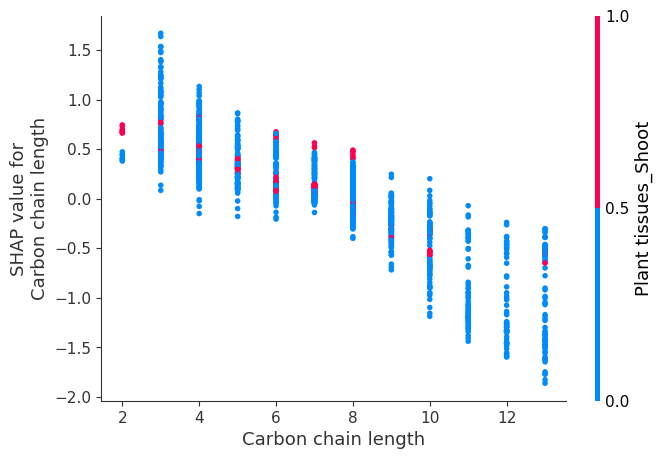

In [14]:
feature_index1 = 0
feature_index2 = 90

shap.dependence_plot(feature_index1, shap_values_full, X_full, interaction_index=feature_index2)

plt.show()

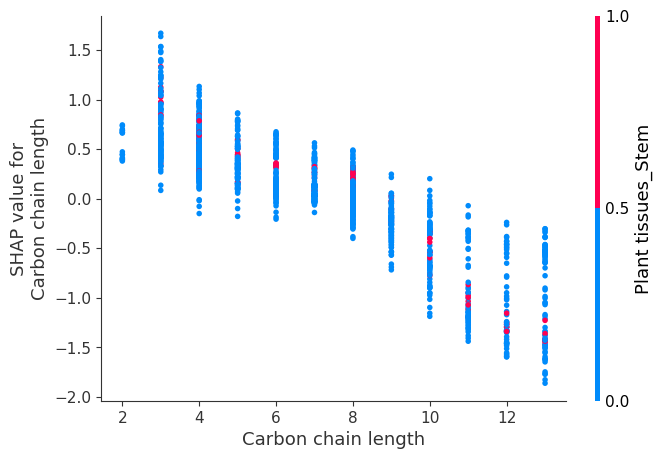

In [15]:
feature_index1 = 0
feature_index2 = 91

shap.dependence_plot(feature_index1, shap_values_full, X_full, interaction_index=feature_index2)

plt.show()

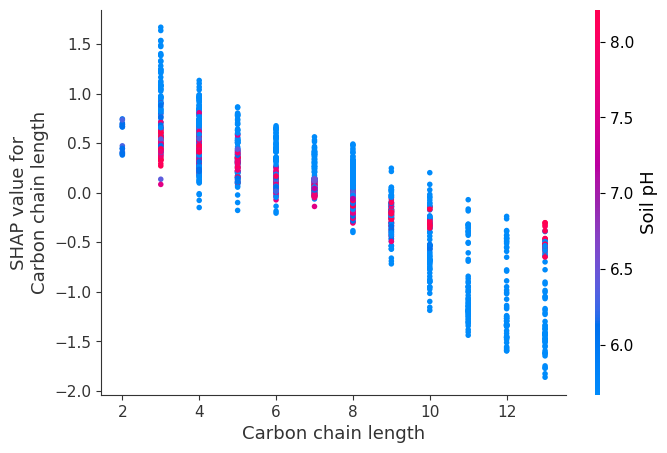

In [11]:
feature_index1 = 0
feature_index2 = 3

shap.dependence_plot(feature_index1, shap_values_full, X_full, interaction_index=feature_index2)

plt.show()